# TODO
    -> add in fits processing a save of png files with transformations to make LSB galaxies pop up.
       ^ maybe do this after aplying the filter? LSBs might be more visible then
    

# Imports

In [2]:
import pandas as pd
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob

from sklearn.cluster import DBSCAN
from mask import get_mask

from utils import getcutout,getwcs,coord2pix
from config import IMAGES_DIR

# Load Images

In [3]:
files = glob.glob(IMAGES_DIR+"*.npz")
data = [np.load(file)['img'] for file in files]


save png file

fig = plt.figure(figsize=(data[i].shape[0]/1000, data[i].shape[1]/1000), dpi=100, frameon=False)  
ax = plt.Axes(fig, [0., 0., 1., 1.])  
ax.set_axis_off()  
fig.add_axes(ax)  
ax.imshow(data[i])  
fig.savefig('myfig.png', dpi=1000)  

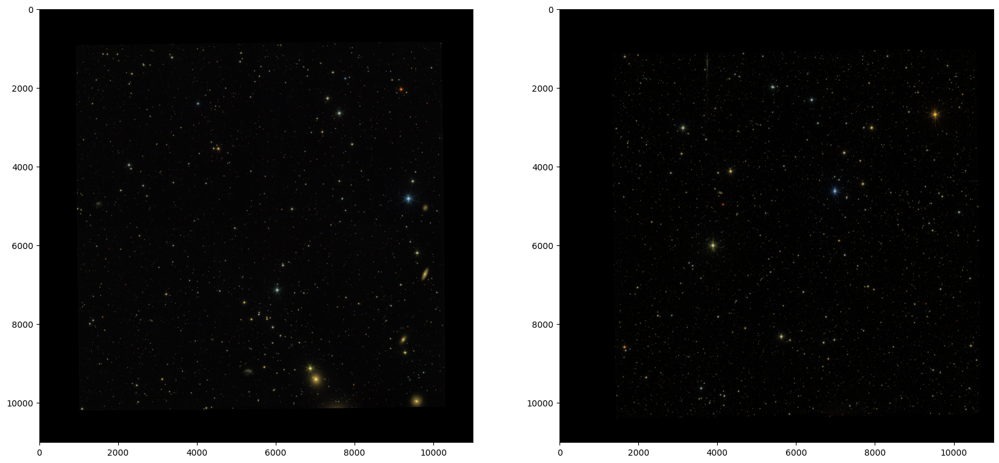

In [3]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
for i in range(2):
    ax[i].imshow(data[i])

# Mask

In [4]:
img = data[0]
mask = get_mask(img[:,:,0],pixel_threshold=250)

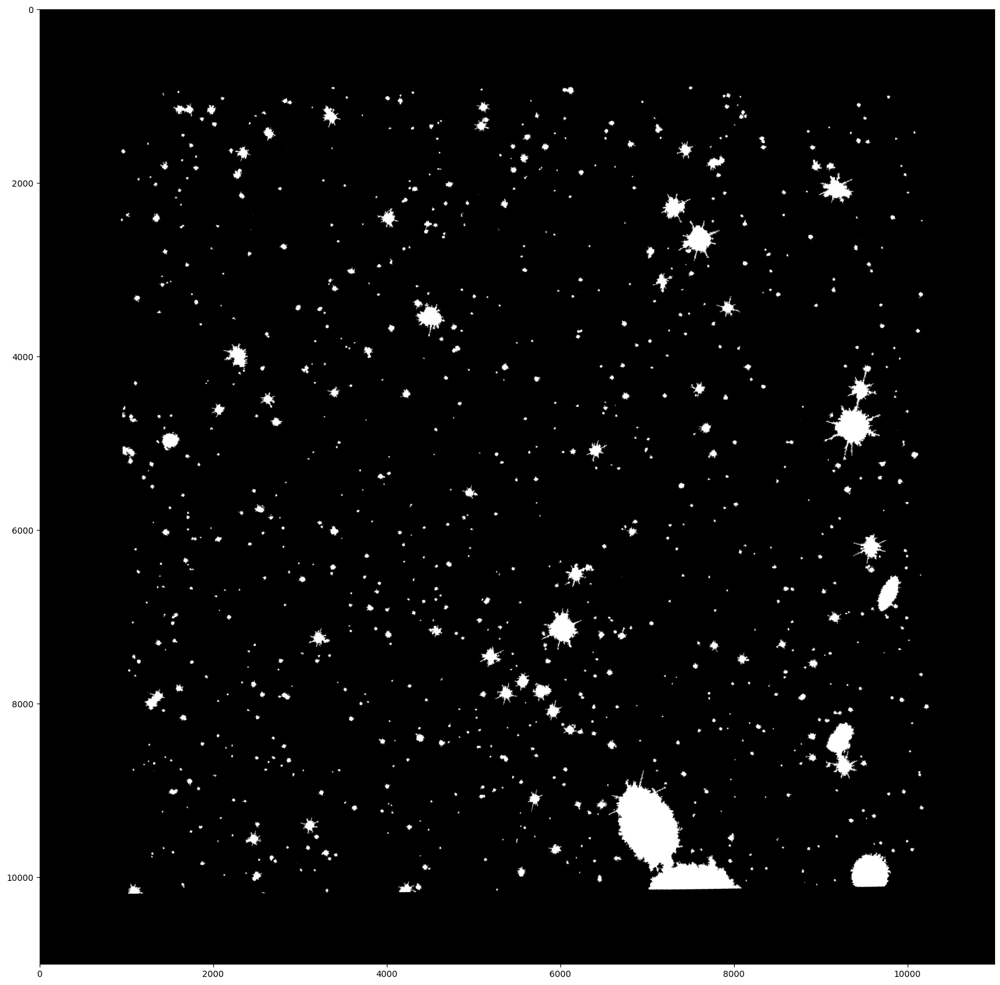

In [5]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(mask, cmap='gray_r');
plt.imsave(fname='data/images/SPLUS-s28s34_mask.png', arr=mask, cmap='gray_r', format='png')

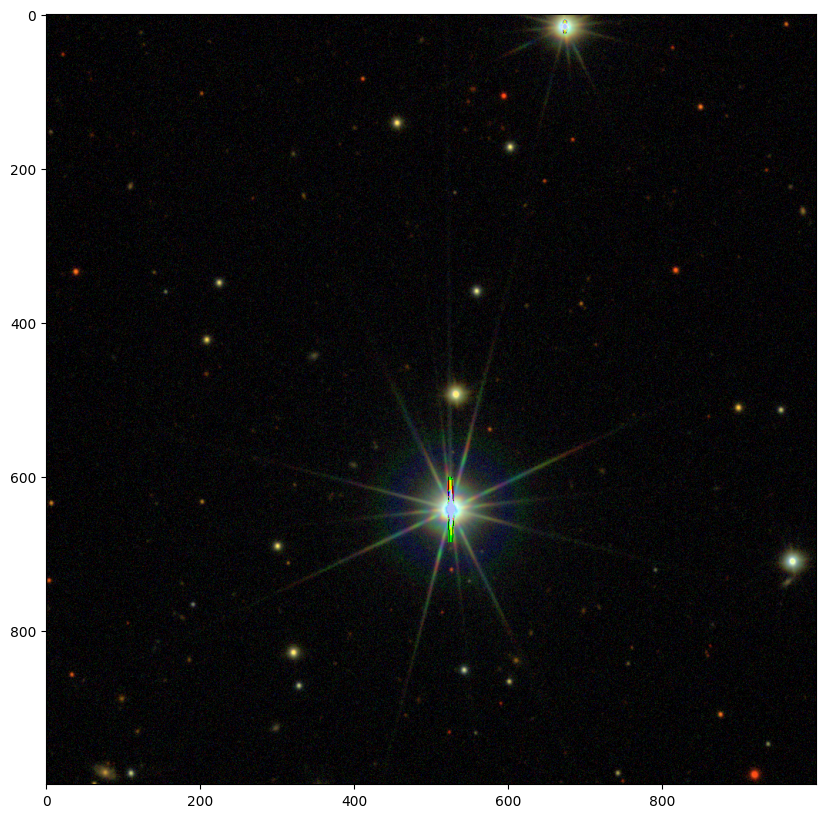

In [7]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(img[6500:7500,5500:6500], cmap='gray_r');

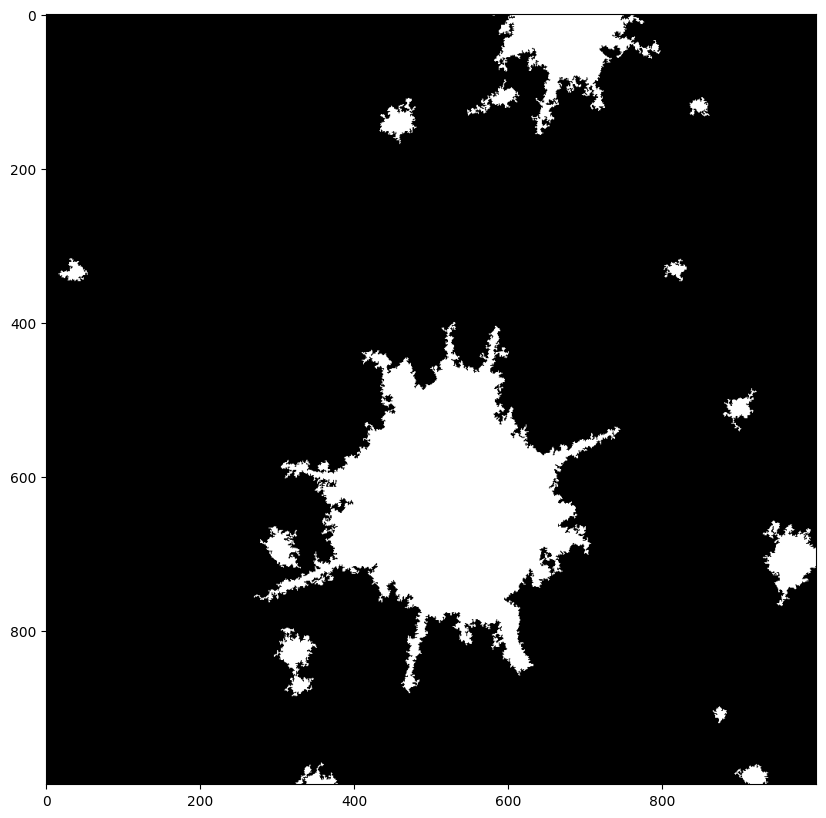

In [8]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask[6500:7500,5500:6500], cmap='gray_r');

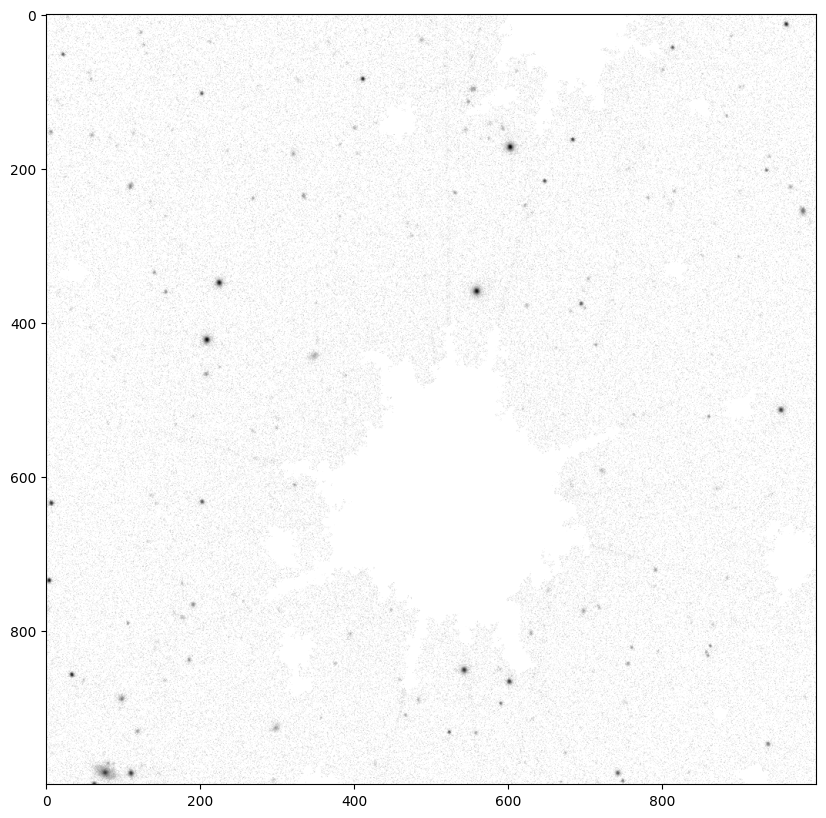

In [9]:
fig,ax = plt.subplots(figsize=(10,10))
mmm = img*np.dstack([mask]*3)
plt.imshow(mmm[6500:7500,5500:6500,0], cmap='gray_r');

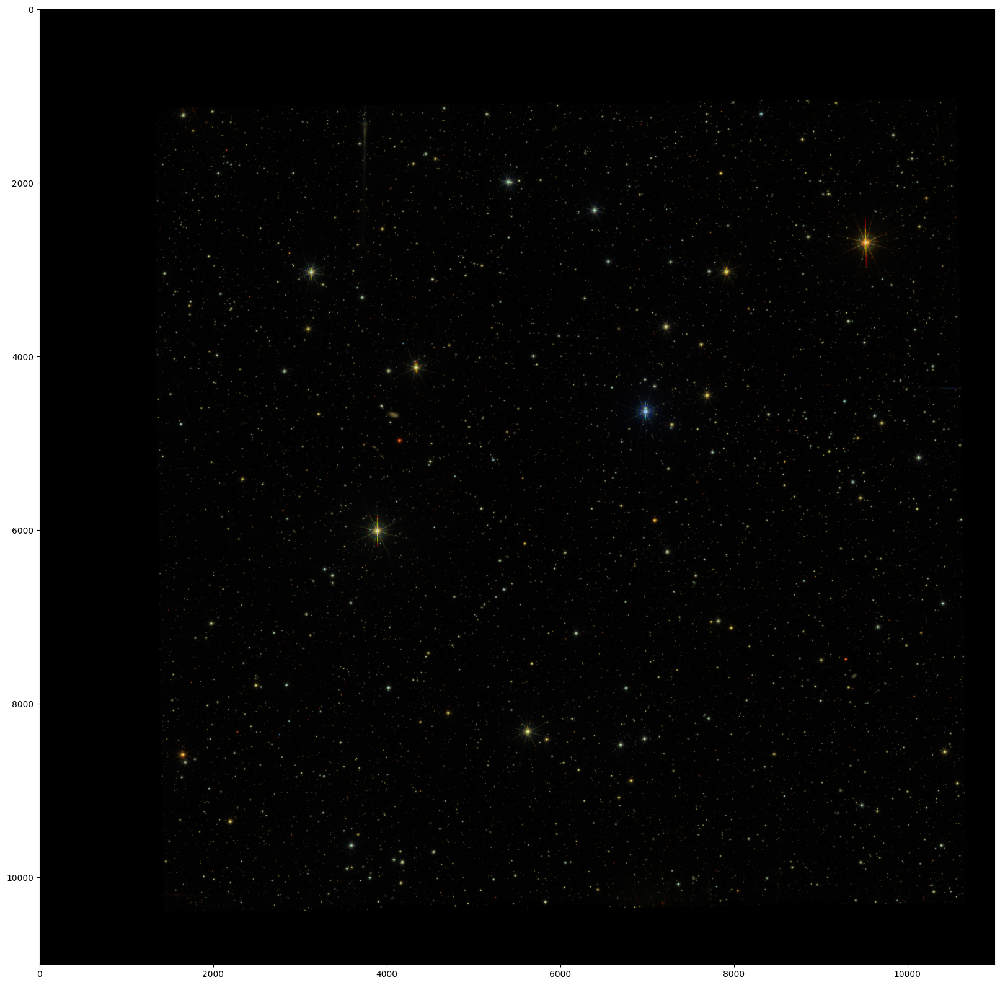

In [10]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1]);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r.png', arr=data[1][:,:,1], cmap='gray_r', format='png')

In [15]:
fig,ax = plt.subplots(figsize=(20,20))
masked_data = data[0]*np.dstack([mask]*3)
plt.imshow(masked_data);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r_masked.png', arr=data[0][:,:,1]*mask, cmap='gray_r', format='png')

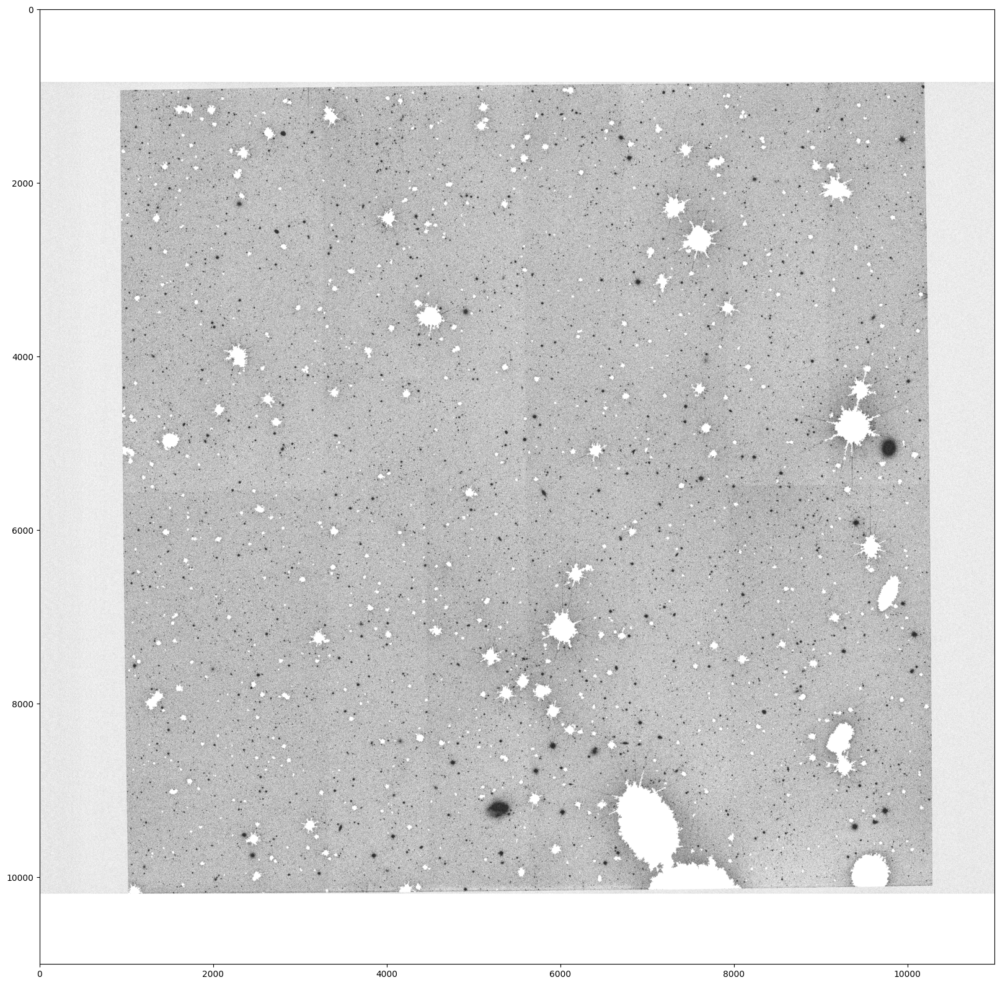

In [16]:
fig,ax = plt.subplots(figsize=(20,20))
stretched = np.arcsinh((10*data[0][:,:,1]*mask)/3)
plt.imshow(stretched , cmap='gray_r');
plt.imsave(fname='data/images/SPLUS-s28s34_band_r_masked_streched.png', arr= stretched, cmap='gray_r', format='png')

# LSBs s28s34

In [17]:
img = np.load('data/images/SPLUS-s28s34_rgb.npz')['img']
wcs_obj = getwcs('data/fits/SPLUS-s28s34_band_R.fits')
coordinates = pd.read_csv("data/LSBs_coordinates/SPLUS-s28s34.csv", usecols = ["Status","RA","DEC"])

In [ ]:
mask = get_mask(img[:,:,0],pixel_threshold=250)

In [ ]:
fig,ax = plt.subplots(32,2,figsize=(20,10*32))
for i,row in coordinates.iterrows():
    RA,DEC,STATUS = row
    ax[i,0].imshow(getcutout(wcs_obj, img, [RA,DEC], size=100)[:,:,0],cmap='gray_r')
    ax[i,0].set_ylabel(STATUS, fontsize=20)
    ax[i,1].imshow(getcutout(wcs_obj, img[:,:,0]*mask, [RA,DEC], size=100),cmap='gray_r')

In [ ]:
from astropy.io import fits
DATA_DIR = "data/fits/"

fits_file = fits.open(DATA_DIR+"SPLUS-s28s34_band_I.fits", memmap=False)
data = fits_file[0].data*mask
header = fits_file[0].header

fits.writeto("data/results/SPLUS-s28s34_band_I_masked.fits", data, header, overwrite = True)

In [ ]:
ddd = pd.read_csv('data/results/original.txt', skiprows=3, header=None)
ddd.columns = ["all"]

In [ ]:
ddd[['_', '_','RA', "DEC"]] = ddd['all'].str.strip().str.split(' ', expand=True)
ddd[["RA","DEC"]] = ddd[["RA","DEC"]].astype(float)
ddd[["RA","DEC"]].query("55.02 <= RA <= 55.03" and "-36.55 <= DEC <= -36.59")#.drop(columns=["index",""])
#55.02931567	-36.55989569

In [ ]:
img.shape

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
position = coord2pix(wcs_obj,[55.0385, -35.6230])
position2 = coord2pix(wcs_obj,[55.0385+0.01, -35.6230+0.01])
position3 = coord2pix(wcs_obj,[55.0385+0.01, -35.6230-0.01])
position4 = coord2pix(wcs_obj,[55.0385-0.01, -35.6230+0.01])
position5 = coord2pix(wcs_obj,[55.0385-0.01, -35.6230-0.01])
plt.scatter(position[0], position[1], marker = "+", s = 50);
plt.scatter(position2[0], position2[1], c= "r", marker = "+", s = 50);
plt.scatter(position3[0], position3[1], c= "r", marker = "+", s = 50);
plt.scatter(position4[0], position4[1], c= "r", marker = "+", s = 50);
plt.scatter(position5[0], position5[1], c= "r", marker = "+", s = 50);
plt.imshow(img[:,:,0] , cmap='gray_r');
#plt.savefig('data/results/sextractor_original.svg',format='svg')
#plt.imsave(fname='data/results/sextractor_original.png', arr= stretched, format='png')

# Toy Example

In [7]:
import scipy.ndimage as ndimage
a = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
              [0, 7, 0, 0, 0, 2, 0, 0, 0, 1],
              [0, 2, 1, 0, 0, 0, 0, 0, 3, 0],
              [0, 0, 0, 2, 0, 2, 1, 7, 2, 0],
              [0, 8, 0, 0, 0, 0, 0, 2, 0, 0],
              [2, 0, 0, 0, 0, 2, 0, 0, 0, 0],
              [0, 0, 0, 9, 0, 0, 0, 0, 0, 5],
              [0, 6, 0, 0, 1, 0, 0, 0, 1, 5],
              [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

bright_pixels = np.where(a < 3, 0, a)
labeled_a,_ = ndimage.label(a)

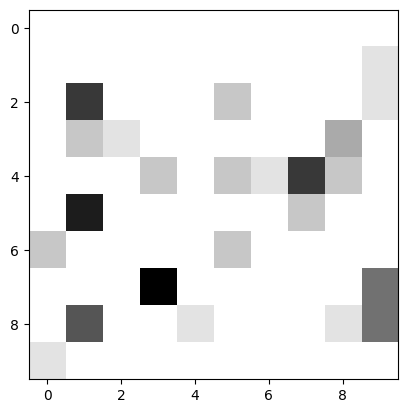

In [11]:
plt.imshow(a, cmap="gray_r")

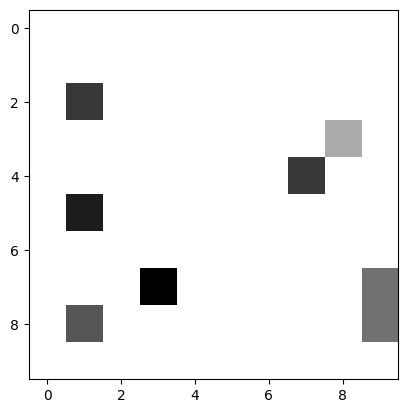

In [12]:
plt.imshow(bright_pixels, cmap="gray_r")

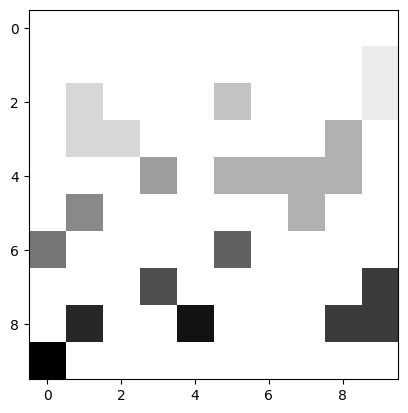

In [10]:


plt.imshow(labeled_a, cmap="gray_r")

# Coordinates Mess

In [ ]:
def get_flags(file_path:str)->pd.DataFrame:
    col_list = ['ID','RA','DEC', 'BrightstarFlag']
    return pd.read_csv(file_path, usecols=col_list)

In [ ]:
flags = get_flags("data/flags/SPLUS-s28s34_matches_masks_zspec.csv")
saturated = flags.query("BrightstarFlag == 2")

In [ ]:
import astropy.wcs as wcs
from astropy.coordinates import SkyCoord
from astropy import units as u
f = fits.open('data/fits/SPLUS-s28s34_bands_RGI.fits')
w = wcs.WCS(f[0].header).dropaxis(2)

In [ ]:
#Saturated objects
c_s = {}
for i in range(saturated.shape[0]):
    c_s[i] = SkyCoord(ra = saturated['RA'].values[i]*u.degree, dec = saturated['DEC'].values[i]*u.degree)

In [ ]:
positions_s = np.zeros((saturated.shape[0], 2))
for i in range(saturated.shape[0]):
    positions_s[i] = w.world_to_pixel(c_s[i])

In [ ]:
#Saving the saturated objects
d = np.array([positions_s[:, 0], positions_s[:, 1]]).T
columns = ['x', 'y']
df = pd.DataFrame(data = d, columns = columns)

In [ ]:
#Visualizing the saturated objects and its insiders
plt.figure(dpi = 100, figsize = (5, 5))
plt.scatter(positions_s[:, 0], positions_s[:, 1], marker = 's', s = 1, label = 'Saturated')
plt.imshow(data[1])

In [ ]:
xp = positions_s[:, 0]
yp = positions_s[:, 1]

In [ ]:
positions_s

In [ ]:
mask = np.histogram2d(xp, yp, bins = 190)[0]

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask)

In [ ]:
mask_res = cv.resize(mask, dsize=(10000, 10000), interpolation=cv.INTER_CUBIC)

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask_res)

In [ ]:
#It different object receives a label/value
labels, numobjects = scipy.ndimage.label(mask_res)

#Changing all nonzero values to one, to build the mask
original_mask = np.copy(labels)
original_mask[np.where(original_mask > 0)] = 1

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(original_mask, origin='lower')

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1])
#plt.imsave(fname='fornax.png', arr=data[1], cmap='gray_r', format='png')

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1][3300:3600,1500:1750])